In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import yfinance as yf
import warnings
warnings.filterwarnings('ignore') # Hide all warnings

In [2]:
def z_score(data):
    return((data - data.rolling(50).mean()) / data.rolling(50).std())

In [3]:
field = pd.DataFrame()

In [13]:
tickers = ["^SPX","MSFT", "AMD", "NVDA", "AMZN", "GS","JNJ","LLY","V","MA","XOM","CAT","KO","PEP","PG","COST","WMT","TSLA", "TSM","ASML","META", "AVGO", "JPM", "GOOG", "GOOGL", "AAL", "AAPL", "DAL", "BAC", "C"]
len(tickers)

30

In [14]:
import yfinance as yf
import pandas as pd

start, end = "2020-01-01", "2025-01-01"

df_all = yf.download(
    tickers,
    start=start,
    end=end,
    group_by="ticker",
    auto_adjust=False,
    progress=False
)

if isinstance(df_all.columns, pd.MultiIndex):
    # Try to detect which level is ticker
    lvl0 = df_all.columns.get_level_values(0)
    lvl1 = df_all.columns.get_level_values(1)

    if set(tickers).issubset(set(lvl0)):
        # columns are (Ticker, Field)
        Field = df_all.loc[:, (slice(None), ["Open","High","Low","Close","Volume"])].copy()
    else:
        # columns are (Field, Ticker) -> swap
        Field = df_all.loc[:, (["Open","High","Low","Close","Volume"], slice(None))].copy()
        Field.columns = Field.columns.swaplevel(0, 1)
        Field = Field.sort_index(axis=1)

else:
    raise ValueError("Expected MultiIndex columns from multi-ticker download")

msft_close = Field[("MSFT", "Close")]
amd_df = Field["AMD"]

In [16]:
df = yf.download("MSFT", start="2000-01-01", end="2025-01-01")
df.columns = df.columns.droplevel(1)
df = df.reset_index(drop = True)

[*********************100%***********************]  1 of 1 completed


In [17]:
test_df = pd.DataFrame(columns = ["Open", "Close", "High", "Low", "Volume", "AVG", "Returns", "MA","IMB", "RETMA"])
for i in range(len(df)):

    AVG = (df.Open[i] + df.Close[i] + df.High[i] + df.Low[i])/4
    imb1 = (df.Close[i]-df.Low[i])/(df.High[i]-df.Low[i])
    
    if i == 0:
        RET = 0
    else:
        RET = (AVG/test_df.iloc[i-1,5]) - 1

    if i >= 10:
        MA = np.mean(test_df.iloc[i-10:i, 5])
        RET_MA = np.mean(test_df.iloc[i-10:i,6])
    else:
        MA = 0
        RET_MA = 0

    test_df.loc[i] = [df.Open[i], df.Close[i], df.High[i], df.Low[i], df.Volume[i], AVG, RET, MA,imb1,RET_MA]

## Question 1 - Trend following.
in periods of positive trends, is the mean return above the overall return?

**Upwards trend**
- t = 300-400, mu = 0.177% return, 100t, mu = 52mil vol
- t = 400-500, mu = 0.04% return, 100t, mu = 51mil vol
    - t = 430-500, mu = 0.62% return, 70t, mu = 52mil vol
- t = 630-660, mu = 0.2% return, 30t, mu = 64.86mil vol
- t = 800-1000, mu = 0.35% return, 200t, mu = 57.6mil vol
    - t = 800-900, mu = 0.469% return, 100t, mu = 62mil vol
    - t = 900-1000, mu = 0.23% return, 100t, mu = 53mil vol
- t = 1200-1400, mu = 0.15% return, 200t, mu = 65.6mil vol
    - t = 1270-1300, mu = 0.36% return, 30t, mu = 76.3mil vol
    - t = 1330-1360, mu = 0.63% return, 30t, mu = 64.3mil vol
- t = 1460-1490, mu = 0.49% return, 30t, mu = 53mil vol
- t = 1600-2000, mu = 0.1% return, 400t, mu = 65.5mil vol
    - t = 1610-1730, mu = 0.196% return, 120t, mu = 66mil vol
    - t = 1610-1725, mu = 0.137% return, 115t, mu = 66.1mil vol
    - t = 1820-2000, mu = 0.2% return, 180t, mu = 65.6mil vol
    - t = 1865-1875, mu = 0.92% return, 10t, mu = 74mil vol
    - t = 1878-1893, mu = 0.53% return, 15t, mu = 57.4mil vol
- t = 2200-3000, mu = 0.065%, 800t, mu = 66mil vol
    - t = 2300-3000, mu = 0.116% return, 700t, mu = 64.5mil vol
        - t = 2300-2400, mu = 0.4% return, 100t, mu = 70mil vol
        - t = 2300-2320, mu = 0.8% return, 20t, mu = 76.5mil vol
        - t = 2320-2390, mu = 0.16% return, 70t, mu = 65.5mil vol
        - t = 2390-2405, mu = 1.05% return, 15t, mu = 87.5mil vol
        - t = 2400-2550, mu = 0.08% return, 150t, mu = 61.7mil vol
        - t = 2550-2590, mu = 0.37% return, 40t, mu = 61.8mil vol
        - t = 2690-2720, mu = 0.27% return, 40t, mu = 65.2mil vol
        - t = 2840-2850, mu = 1.6% return, 10t, mu = 91.8mil vol
        - t = 2940-2980, mu = 0.477% return, 40t, mu = 70.65mil vol

**Downwards trend**
- t = 200-400, mu = -0.012% return, 200t, mu = 52.6mil vol
    - t = 200-300, mu = -0.2% return, 100t, mu = 53.1mil vol
- t = 500-600, mu = -0.076% return, 100t, mu = 47.8mil vol
    - t = 505-540, mu = -0.522% return, 35t, mu = 50.8mil vol
    - t = 545-600, mu = -0.23% return, 55t, mu = 44.3mil vol
- t = 600-660, mu = -0.6% return, 60t, mu = 62.8mil vol
    - t = 600-630, mu = -1.4% return, 30t, mu = 60.9mil vol
- t = 660-700, mu = -0.75% return, 40t, mu = 65.8mil
    - t = 660-690, mu = -0.84% return, 30t, mu = 60.2mil
- t = 1000-1200, mu = -0.2% return, 200t, mu = 63.5mil vol
    - t = 1010-1060, mu = -0.50 return, 50t, mu = 64.5mil vol
    - t = 1060-1120, mu = 0.08% return, 60t, mu = 59.7mil vol
    - t = 1120-1180, mu = -0.45% return, 60t, mu = 68.8mil vol
    - t = 1130-1140, mu = -1.41% return, 10t, mu = 85mil vol
    - t = 1170-1200, mu = -0.21% return, 30t, mu = 73mil vol 
    - t = 1120-1200, mu = -0.36% return = 80t, mu = 68.6mil vol
- t = 1300-1500, mu = 0.03% return, 200t, mu = 55.5mil vol
    - t = 1300-1330, mu = -0.336% return, 30t, mu = 58.9mil vol
    - t = 1300-1310, mu = -0.61% return, 10t, mu = 62mil vol
    - t = 1400-1465, mu = -0.24% return, 65t, mu = 49.67mil vol
- t = 1500-1600, mu = -0.286% return, 100t, mu = 78mil vol
    - t = 1512-1522, mu = -1.95% return, 10t, mu = 111.65mil vol
    - t = 1522-1600, mu = -0.133% return, 78t, mu = 80.3mil vol
    - t = 1550-1580, mu = -0.1458% return, 30t, mu = 73.18mil vol
- t = 2810-2830, mu = -0.41% return, 20t, mu = 59.38mil vol
- t = 2900-2940, mu = -0.26% return, 40t, mu = 59.61mil vol

2300-2320 logistic curve
2390-2405 logistic curve

-1.1239196020831543
28.31209


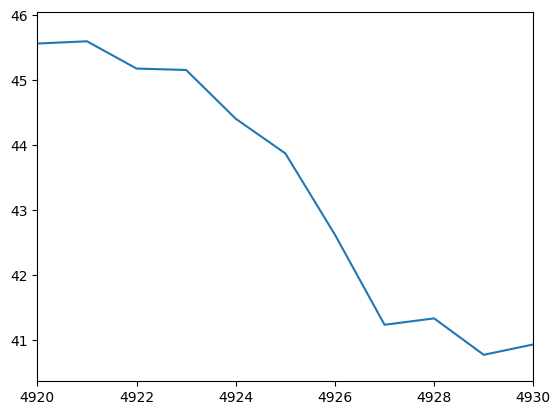

In [233]:
t = 4920
t2 = 4930
plt.plot(test_df["AVG"])
print(np.mean(test_df["Returns"][t:t2])*100)
print(np.mean(test_df["Volume"][t:t2])/1000000)
#plt.plot(test_df["RETMA"])
#plt.plot()
#plt.plot(test_df["MA"]-df["MA"])
plt.xlim(t,t2)
#plt.ylim(10,16)
plt.ylim(min(test_df["AVG"][t:t2])*(0.99),max(test_df["AVG"][t:t2])*(1.01))
#plt.ylim(min(test_df["RETMA"][t:t2])*(0.99),max(test_df["RETMA"][t:t2])*(1.01))
plt.show()

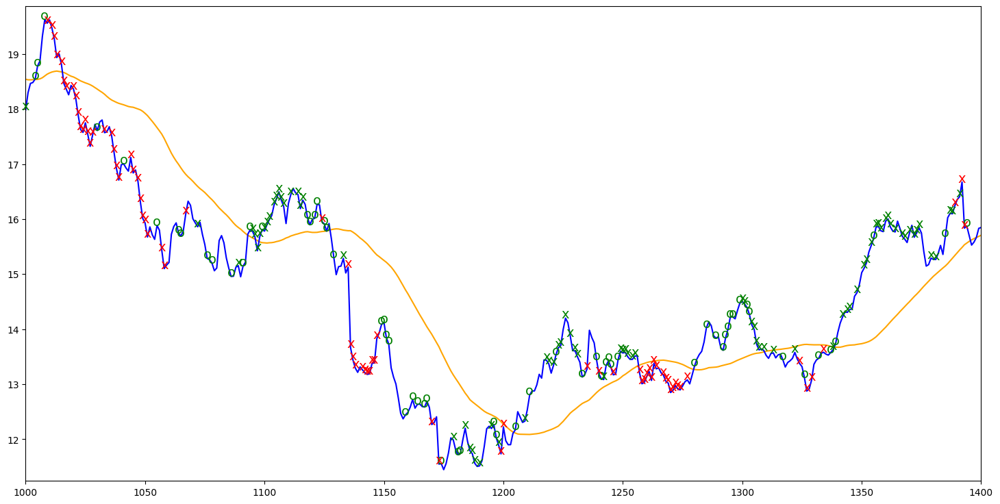

In [135]:
# 1. cutting points.
# 2. turning points.

t = 1000
t2 = t + 400

df['long_signal'] = False
df['long_signal'] = (df["S"] <= 0.5) & (df["S"] >= -0.5)
# Generate short (sell) signals
df['short_signal'] = False
df['short_signal'] = (df["S"] >= 2)

df['short_signal2'] = False
df['short_signal2'] = (df["S"] <= -2)

fig, ax = plt.subplots(figsize=(18, 9)) 

# Add arrows for long (buy) signals
long_signal_dates = df[df['long_signal']].index
for date in long_signal_dates:
    ax.annotate('o', xy=(date, df.loc[date, 'AVG']), color='green', fontsize=14, ha='center')

# Add arrows for short (sell) signals
short_signal_dates = df[df['short_signal']].index
for date in short_signal_dates:
    ax.annotate('x', xy=(date, df.loc[date, 'AVG']), color='green', fontsize=14, ha='center')

# Add arrows for short (sell) signals
short_signal_dates = df[df['short_signal2']].index
for date in short_signal_dates:
    ax.annotate('x', xy=(date, df.loc[date, 'AVG']), color='red', fontsize=14, ha='center')

plt.plot(df["MA"], color = "orange")
plt.plot(df["AVG"], color = "blue")
plt.xlim(t,t2)
plt.ylim(min(df["Close"][t:t2])*(0.99),max(df["Close"][t:t2])*(1.01))
plt.show()

## Question 2 

In [102]:
# is the mean volume, in periods where price is above MA, larger?
n = 0
for i in range(len(test)):
    if test[i] > np.mean(test_df[test_df["AVG"] < test_df["MA"]].Volume):
        n = n + 1

n = n / len(test)
n
#np.mean(test_df[test_df["AVG"] > test_df["MA"]].Volume) > np.mean(test_df[test_df["AVG"] < test_df["MA"]].Volume) # true:BTC, true:ETH, true:XRP
# False: JPM, False: MSFT, True: AMD, False: AAL

0.27068832173240526

In [3]:
df["AVG"] = (df.Open + df.High + df.Low + df.Close)/4
df["Returns_C"] = df.Close.diff() / df.Close.shift(1)
df["Returns"] = df.AVG.diff() / df.AVG.shift(1)
df["EXP_ret1"] = (df.AVG.shift(-1) - df.AVG)/df.AVG
df["EXP_ret2"] = (df.AVG.shift(-2) - df.AVG)/df.AVG
df["EXP_ret3"] = (df.AVG.shift(-3) - df.AVG)/df.AVG
df["EXP_ret4"] = (df.AVG.shift(-4) - df.AVG)/df.AVG
df["EXP_ret5"] = (df.AVG.shift(-5) - df.AVG)/df.AVG
df["EXP_ret6"] = (df.AVG.shift(-6) - df.AVG)/df.AVG
df["EXP_ret7"] = (df.AVG.shift(-7) - df.AVG)/df.AVG
df["EXP_ret8"] = (df.AVG.shift(-8) - df.AVG)/df.AVG
df["EXP_ret9"] = (df.AVG.shift(-9) - df.AVG)/df.AVG
df["EXP_ret10"] = (df.AVG.shift(-10) - df.AVG)/df.AVG
ret_m = []
for i in range(len(df)):
    if i < 50:
        ret_m.append(0)
    else:
        ret_m.append(np.mean(df["Returns"][i-50:i]))

df["Returns_m"] = ret_m
import numpy as np
import pandas as pd

up = (df["Close"] > df["Open"]).astype(int)
down = (df["Close"] < df["Open"]).astype(int)

v_up = df["Volume"] * up
v_down = df["Volume"] * down

df["vol_imbalance"] = (v_up - v_down) / df["Volume"].replace(0, np.nan)
df["vol_imbalance_ema"] = df["vol_imbalance"].ewm(span=50, adjust=False).mean()
rng = (df["High"] - df["Low"]).replace(0, np.nan)
df["clv"] = (2*df["Close"] - df["High"] - df["Low"]) / rng
df["adl"] = (df["clv"] * df["Volume"]).cumsum()   # accumulation/distribution line
df["cmf_20"] = (df["clv"] * df["Volume"]).rolling(50).sum() / df["Volume"].rolling(20).sum()

rng = (df["High"] - df["Low"]).replace(0, np.nan)
ret = df["Close"].pct_change().abs()

df["effort_result"] = df["Volume"] / rng
df["impact_per_vol"] = ret / df["Volume"].replace(0, np.nan)

upper_wick = df["High"] - df[["Open","Close"]].max(axis=1)
lower_wick = df[["Open","Close"]].min(axis=1) - df["Low"]
rng = (df["High"] - df["Low"]).replace(0, np.nan)

df["upper_wick_pct"] = upper_wick / rng
df["lower_wick_pct"] = lower_wick / rng
df["vol_z"] = (df["Volume"] - df["Volume"].rolling(50).mean()) / df["Volume"].rolling(50).std()


df["S"] = z_score(df["cmf_20"])-z_score(df["upper_wick_pct"]*df["vol_z"]) -z_score(df["lower_wick_pct"]*df["vol_z"])

In [4]:
indx = df[df["Returns_m"] > 0].index

p1 = p2 = p3 = p4 = p5 = p6 = p7 = p8 = p9 = p10 = 0
for i in indx:
    if df["EXP_ret1"][i] > 0:
        p1 = p1 + 1
    
    if df["EXP_ret2"][i] > 0:
        p2 = p2 + 1

    if df["EXP_ret3"][i] > 0:
        p3 = p3 + 1

    if df["EXP_ret4"][i] > 0:
        p4 = p4 + 1

    if df["EXP_ret5"][i] > 0:
        p5 = p5 + 1

    if df["EXP_ret6"][i] > 0:
        p6 = p6 + 1

    if df["EXP_ret7"][i] > 0:
        p7 = p7 + 1

    if df["EXP_ret8"][i] > 0:
        p8 = p8 + 1

    if df["EXP_ret9"][i] > 0:
        p9 = p9 + 1

    if df["EXP_ret10"][i] > 0:
        p10 = p10 + 1


p1 = p1/len(indx)
p2 = p2/len(indx)
p3 = p3/len(indx)
p4 = p4/len(indx)
p5 = p5/len(indx)
p6 = p6/len(indx)
p7 = p7/len(indx)
p8 = p8/len(indx)
p9 = p9/len(indx)
p10 = p10/len(indx)

In [5]:
print(p1)
print(p2)
print(p3)
print(p4)
print(p5)
print(p6)
print(p7)
print(p8)
print(p9)
print(p10)

0.542896050839764
0.5401724920562869
0.5433499773036768
0.5447117566954154
0.5451656831593282
0.5438039037675897
0.542896050839764
0.5451656831593282
0.5419881979119383
0.5397185655923741


In [4]:
#np.mean(df.Returns[4300:4600])


# 4000-4150 -> -0.1285%

# 100-150 -> -0.3179%


# T->T2 : R>0?
# 4200-4350 -> 0.2064%
# 4300-4450 -> 0.1515%

In [6]:
signal = []
for i in range(len(df)):
    if df.Returns[i] <= df.Returns_m[i]  and df.Returns_m[i] > 0:
        signal.append(1)
    elif df.Returns[i] >= df.Returns_m[i]  and df.Returns_m[i] > 0:
        signal.append(-1)
    else:
        signal.append(0)

df["Signal"] = signal

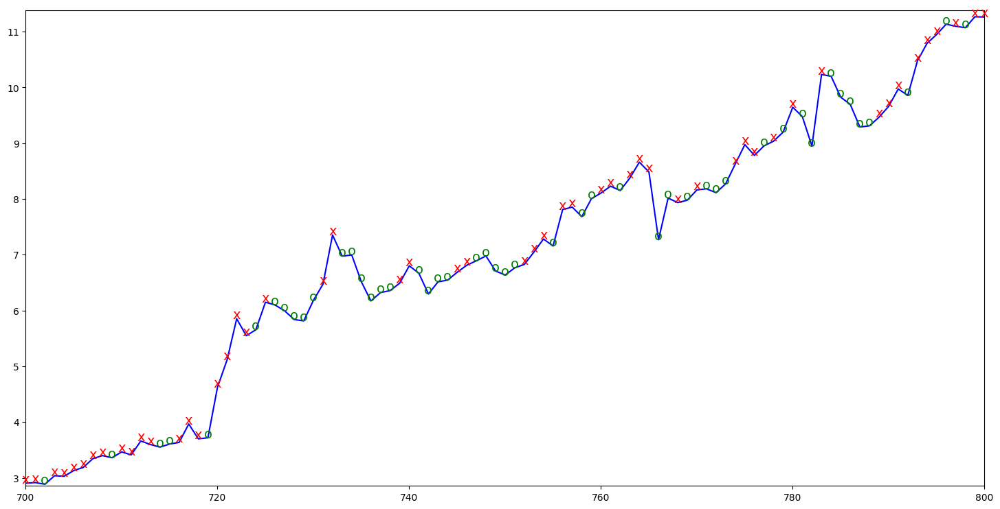

In [11]:
# 1. cutting points.
# 2. turning points.

t = 700
t2 = t + 100

df['long_signal'] = False
df['long_signal'] = (df["Signal"] == 1)
# Generate short (sell) signals
df['short_signal'] = False
df['short_signal'] = (df["Signal"] == -1)              #(dal_df["MA21D"] > 0.05) & (abs(dal_df["U"]) > 0) 

fig, ax = plt.subplots(figsize=(18, 9)) 

# Add arrows for long (buy) signals
long_signal_dates = df[df['long_signal']].index
for date in long_signal_dates:
    ax.annotate('o', xy=(date, df.loc[date, 'Close']), color='green', fontsize=14, ha='center')

# Add arrows for short (sell) signals
short_signal_dates = df[df['short_signal']].index
for date in short_signal_dates:
    ax.annotate('x', xy=(date, df.loc[date, 'Close']), color='red', fontsize=14, ha='center')

plt.plot(df["Close"], color = "blue")
plt.xlim(t,t2)
plt.ylim(min(df["Close"][t:t2])*(0.99),max(df["Close"][t:t2])*(1.01))
plt.show()

1.3274796049893056


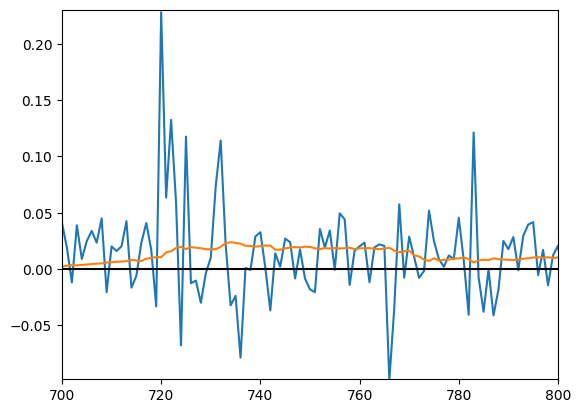

In [10]:
c = df.Returns
#d = df.Returns_m
#c = df["EXP_ret5"]
d = df.Returns_m
#plt.plot(df.Close)
#plt.plot(df.AVG)
#plt.plot(df.Returns)
plt.plot(c)
plt.plot(d)
t = 700
t2 = t + 100
plt.xlim(t,t2)
plt.ylim(min(c[t:t2])*(0.99),max(c[t:t2])*(1.01))
plt.axhline(y = 0, color = "black")
print(np.mean(d[t:t2])*100)
plt.show()

In [25]:
import numpy as np
import pandas as pd
from collections import deque
from dataclasses import dataclass

@dataclass
class Bar:
    Open: float
    High: float
    Low: float
    Close: float

class TF:
    def __init__(
        self,
        mean_window: int = 50,          # <-- your Returns_mean_of_50
        vol_window: int = 20,
        target_vol_annual: float = 0.10,
        max_leverage: float = 1.0,
        long_only: bool = True,
        min_bars_buffer: int = 5,
        use_log_returns: bool = True,
    ):
        self.i = 0
        self.in_pos = False

        self.df = pd.DataFrame(columns=[
            "Open", "Close", "High", "Low",
            "AVGP", "RET",
            "RET_M", "SIG",
            "VOL", "W"
        ])

        self.prev_avgp = None

        self.mean_window = mean_window
        self.vol_window = vol_window
        self.target_vol_annual = target_vol_annual
        self.max_leverage = max_leverage
        self.long_only = long_only
        self.use_log_returns = use_log_returns

        self.ret_window = deque(maxlen=vol_window)         # for vol
        self.ret_mean_window = deque(maxlen=mean_window)   # for mean signal

        # warmup must cover mean + vol
        self.min_bars = max(mean_window, vol_window) + min_bars_buffer

    def _calc_return(self, avgp: float) -> float:
        if self.prev_avgp is None or self.prev_avgp <= 0 or avgp <= 0:
            return 0.0
        if self.use_log_returns:
            return float(np.log(avgp / self.prev_avgp))
        else:
            return float(avgp / self.prev_avgp - 1.0)

    def _update(self, bar: Bar):
        # 1) AVGP
        avgp = (bar.Open + bar.Close + bar.Low + bar.High) / 4.0

        # 2) Return
        ret = self._calc_return(avgp)

        # 3) Update rolling windows
        self.ret_window.append(ret)
        self.ret_mean_window.append(ret)

        # 4) Rolling mean of returns (RET_M)
        if len(self.ret_mean_window) == self.mean_window:
            ret_m = float(np.mean(self.ret_mean_window))
        else:
            ret_m = np.nan

        # 5) Signal from your rule
        #    (long-only: sig in {0,1}; long/short: could map {-1,0,1} if desired)
        sig = 0.0
        if np.isfinite(ret_m) and ret_m > 0:
            if ret <= ret_m:
                sig = 1.0
            else:  # ret > ret_m
                sig = 0.0 if self.long_only else -1.0

        # 6) Annualised vol estimate
        if len(self.ret_window) >= 2:
            vol = float(np.std(np.array(self.ret_window), ddof=0) * np.sqrt(252))
        else:
            vol = np.nan

        # 7) Vol-target weight
        if (not np.isfinite(vol)) or vol <= 1e-12:
            w = 0.0
        else:
            w = sig * (self.target_vol_annual / vol)
            if self.long_only:
                w = float(np.clip(w, 0.0, self.max_leverage))
            else:
                w = float(np.clip(w, -self.max_leverage, self.max_leverage))

        # 8) Save row
        self.df.loc[self.i] = [
            bar.Open, bar.Close, bar.High, bar.Low,
            avgp, ret,
            ret_m, sig,
            vol, w
        ]
        self.i += 1
        self.prev_avgp = avgp

    def decision(self):
        if len(self.df) < self.min_bars:
            return "hold"

        sig = float(self.df.iloc[-1]["SIG"])
        w = float(self.df.iloc[-1]["W"])

        if w == 0.0:
            sig = 0.0

        if sig > 0 and not self.in_pos:
            self.in_pos = True
            return "buy"

        if sig == 0 and self.in_pos:
            self.in_pos = False
            return "sell"

        return "hold"


In [27]:
import numpy as np
import pandas as pd
from dataclasses import dataclass
from backtesting import Backtest, Strategy

# --- Minimal Bar compatible with TF
@dataclass
class Bar:
    Open: float
    High: float
    Low: float
    Close: float

# --- Your TF class pasted as-is (unchanged)
# (paste TF here)

class TFBacktestingPy(Strategy):
    # backtesting.py params must be class attrs
    fast_span = 16
    slow_span = 64
    vol_window = 20
    target_vol_annual = 0.10
    max_leverage = 1.0
    long_only = True
    min_bars_buffer = 5

    def init(self):
        self.tf = TF()

    def next(self):
        # NOTE: backtesting.py calls next() with current bar already known.
        # If you want "decide at open" only, you must not use today's H/L/C here.
        bar = Bar(
            Open=float(self.data.Open[-1]),
            High=float(self.data.High[-1]),
            Low=float(self.data.Low[-1]),
            Close=float(self.data.Close[-1]),
        )

        self.tf._update(bar)
        dec = self.tf.decision()

        # Optional: use TF's weight as target exposure (simple approximation)
        w = float(self.tf.df.iloc[-1]["W"]) if len(self.tf.df) else 0.0

        if dec == "buy":
            # backtesting.py uses integer size by default.
            # For “target percent”, we approximate via fraction of equity / close.
            if not self.position:
                cash_to_use = self.equity * w  # 0..1 in long-only
                size = int(cash_to_use / bar.Close)
                if size > 0:
                    self.buy(size=size)

        elif dec == "sell":
            if self.position:
                self.position.close()


# ---- Run
# df must have columns: Open High Low Close (and optionally Volume)
# index should be datetime, sorted ascending
# df = ...

bt = Backtest(
    df,
    TFBacktestingPy,
    cash=100_000,
    commission=0.0008,     # 0.05% per trade
    trade_on_close=True,   # executes on the bar close
    exclusive_orders=True
)

stats = bt.run()
print(stats)
bt.plot()


Backtest.run:   0%|          | 0/6288 [00:00<?, ?bar/s]

Start                     2000-01-03 00:00:00
End                       2024-12-31 00:00:00
Duration                   9129 days 00:00:00
Exposure Time [%]                    45.69884
Equity Final [$]                 127100.38152
Equity Peak [$]                  146610.38291
Commissions [$]                   79914.41991
Return [%]                           27.10038
Buy & Hold Return [%]             29603.11993
Return (Ann.) [%]                     0.96554
Volatility (Ann.) [%]                 8.94897
CAGR [%]                              0.66417
Sharpe Ratio                          0.10789
Sortino Ratio                         0.16283
Calmar Ratio                          0.02908
Alpha [%]                         -2899.61303
Beta                                  0.09887
Max. Drawdown [%]                   -33.20702
Avg. Drawdown [%]                    -2.10675
Max. Drawdown Duration     5551 days 00:00:00
Avg. Drawdown Duration      174 days 00:00:00
# Trades                          

GridPlot(id='p1679', ...)

Start                               2000-01-03 00:00:00
End                                 2024-12-31 00:00:00
Period                               6289 days 00:00:00
Start Value                                       100.0
End Value                                    250.498535
Total Return [%]                             150.498535
Benchmark Return [%]                       29603.119929
Max Gross Exposure [%]                            100.0
Total Fees Paid                               87.730081
Max Drawdown [%]                              21.223878
Max Drawdown Duration                2090 days 00:00:00
Total Trades                                       1521
Total Closed Trades                                1520
Total Open Trades                                     1
Open Trade PnL                                -1.622933
Win Rate [%]                                  50.657895
Best Trade [%]                                14.979556
Worst Trade [%]                              -17

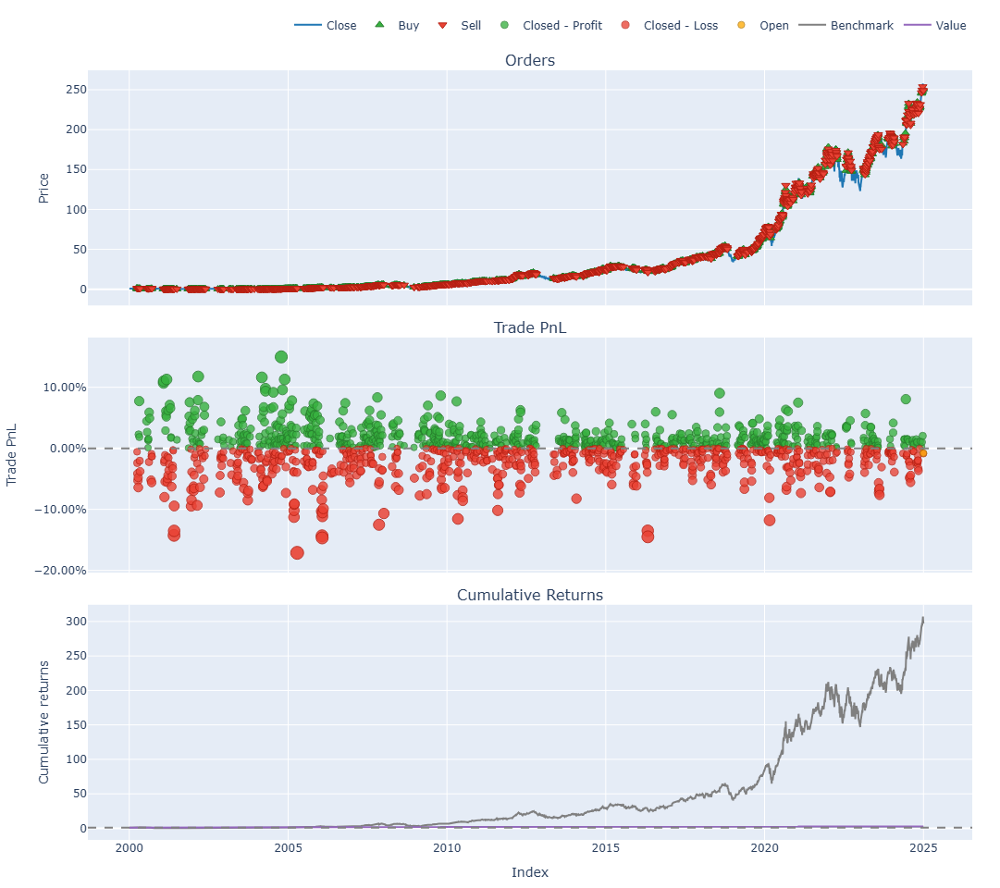

In [29]:
import numpy as np
import pandas as pd
import vectorbt as vbt

def backtest_ret_vs_mean(
    df: pd.DataFrame,
    mean_window: int = 50,
    vol_window: int = 20,
    target_vol_annual: float = 0.10,
    max_leverage: float = 1.0,   # for long-only, keep 1.0
    long_only: bool = True,
    fees: float = 0.0005,        # 0.05%
    slippage: float = 0.0003,    # 0.03%
    warmup_buffer: int = 5,
    freq: str = "1D"
):
    # Expect df has Open, High, Low, Close columns and a datetime index.
    df = df.copy()

    # 1) AVGP and log return
    avgp = (df["Open"] + df["High"] + df["Low"] + df["Close"]) / 4.0
    ret = np.log(avgp / avgp.shift(1)).fillna(0.0)

    # 2) rolling mean of returns (your "Returns_mean_of_50")
    ret_m = ret.rolling(mean_window).mean()

    # 3) your signal rule (raw):
    # buy(1) if ret <= ret_m and ret_m > 0
    # sell/exit otherwise (0 for long-only; -1 for long/short)
    cond_regime = ret_m > 0
    cond_buy = ret <= ret_m

    if long_only:
        sig = (cond_regime & cond_buy).astype(float)   # 1 or 0
    else:
        sig = np.where(cond_regime & cond_buy, 1.0,
              np.where(cond_regime & (~cond_buy), -1.0, 0.0))

    # 4) vol estimate + vol-target weight
    vol = ret.rolling(vol_window).std(ddof=0) * np.sqrt(252)

    w = sig * (target_vol_annual / vol)
    w = w.replace([np.inf, -np.inf], np.nan).fillna(0.0)

    if long_only:
        w = w.clip(0.0, max_leverage)
    else:
        w = w.clip(-max_leverage, max_leverage)

    # 5) warmup gate
    min_bars = max(mean_window, vol_window) + warmup_buffer
    w.iloc[:min_bars] = 0.0

    # 6) NO-LOOKAHEAD SHIFT:
    # compute signal using information up to bar t-1, execute at bar t close
    w_exec = w.shift(1).fillna(0.0)

    # 7) portfolio: target percent exposure at Close
    pf = vbt.Portfolio.from_orders(
        close=df["Close"],
        size=w_exec,
        size_type="targetpercent",
        fees=fees,
        slippage=slippage,
        freq=freq
    )

    features = pd.DataFrame(
        {"AVGP": avgp, "RET": ret, "RET_M": ret_m, "SIG": sig, "VOL": vol, "W": w, "W_EXEC": w_exec},
        index=df.index
    )
    return pf, features


# --- usage ---
# df = your OHLC dataframe with columns Open/High/Low/Close and datetime index
pf, feats = backtest_ret_vs_mean(df)
print(pf.stats())
pf.plot().show()
